# Part 1: Architecture Understanding

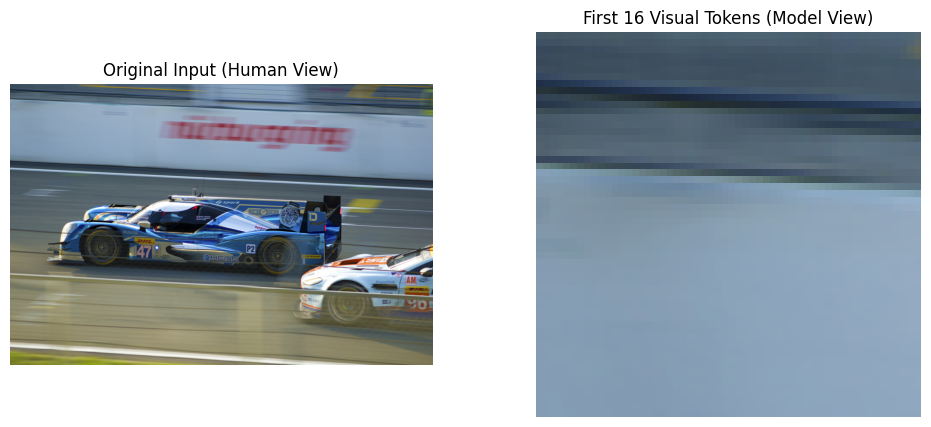

Stage 1: Image is shredded into 576 spatial patches.
Stage 2: CLIP outputs features of shape [1, 576, 1024]
Stage 3: Projection layer outputs tokens of shape torch.Size([1, 576, 4096])


In [7]:
import torch
import torch.nn as nn
from PIL import Image
import matplotlib.pyplot as plt
import torchvision.transforms as T

# 1. LOAD ONE OF YOUR ACTUAL IMAGES
img_path = 'data/7.jpg'  # Updated to match your ls output
try:
    raw_image = Image.open(img_path).convert('RGB')
except FileNotFoundError:
    print(f"Check your path! Current directory: {os.getcwd()}")

# 2. PRE-PROCESS (LLaVA-1.5 standard: 336x336)
transform = T.Compose([
    T.Resize((336, 336)),
    T.ToTensor()
])
img_tensor = transform(raw_image).unsqueeze(0) #

# 3. DISPLAY ORIGINAL AND PATCHES
fig = plt.figure(figsize=(12, 5))

# Plot Original
ax1 = fig.add_subplot(1, 2, 1)
ax1.imshow(raw_image)
ax1.set_title("Original Input (Human View)")
ax1.axis('off')

# Extract 14x14 patches (Visual Tokens)
patch_size = 14
patches = img_tensor.unfold(2, patch_size, patch_size).unfold(3, patch_size, patch_size)
# Reshape for display: [Batch, Channels, Rows, Cols, H, W]

# Plot a 4x4 sample of the 576 tokens
ax2 = fig.add_subplot(1, 2, 2)
canvas = torch.zeros((4*patch_size, 4*patch_size, 3))
for i in range(16):
    r, c = i // 4, i % 4
    p = patches[0, :, r, c].permute(1, 2, 0)
    canvas[r*patch_size:(r+1)*patch_size, c*patch_size:(c+1)*patch_size] = p

ax2.imshow(canvas)
ax2.set_title("First 16 Visual Tokens (Model View)")
ax2.axis('off')
plt.show()

# 4. DATA FLOW DIMENSIONS
clip_dim = 1024
llm_dim = 4096
num_tokens = 576

print(f"Stage 1: Image is shredded into {num_tokens} spatial patches.")
print(f"Stage 2: CLIP outputs features of shape [1, {num_tokens}, {clip_dim}]")

# Simulate LLaVA-1.5 MLP Projection
mlp = nn.Sequential(nn.Linear(clip_dim, llm_dim), nn.GELU(), nn.Linear(llm_dim, llm_dim))
visual_tokens = mlp(torch.randn(1, num_tokens, clip_dim))

print(f"Stage 3: Projection layer outputs tokens of shape {visual_tokens.shape}")

All input images are copyright of Ruchik Yajnik

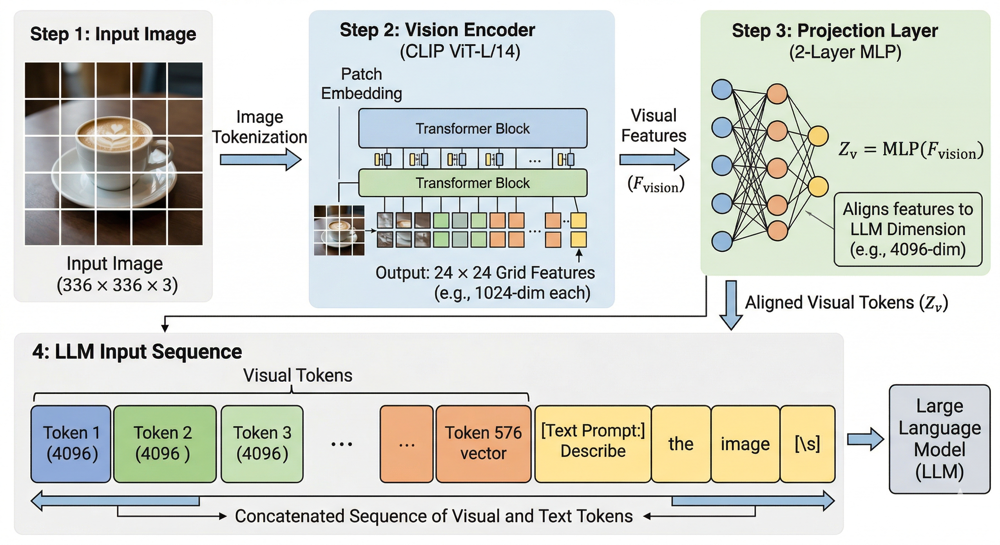

## Task 1.1: Forward Pass Explanation - Data Flow Architecture

### 1.1 Data Flow Architecture

The LLaVA architecture functions as a multimodal pipeline that translates spatial visual information into a temporal sequence of embeddings. The following stages outline the transition from a high-resolution image (such as the racing prototype in `7.jpg`) to generated text:

---

#### **I. Image Input**
The pipeline begins with a raw RGB image. In the **LLaVA-1.5** configuration, this image is pre-processed through resizing and normalization to a fixed resolution of **336 × 336 pixels**.

#### **II. Vision Encoder (CLIP ViT-L/14)**
The processed image is passed through a pre-trained Vision Transformer (ViT). The ViT "shreds" the image into $14 \times 14$ pixel patches. 
* **Calculation:** $\frac{336}{14} = 24$ patches per side.
* **Total:** $24 \times 24 = 576$ spatial patches.

#### **III. Projection Layer (The Bridge)**
Each of the 576 patches is represented by a 1024-dimensional feature vector. The Projection Layer—a **2-layer MLP** (Multi-Layer Perceptron) in v1.5—acts as a coordinate transformation bridge.
* **Transformation:** $z = W \cdot f_{vision}(x)$
* **Dimension Mapping:** Transforms vectors from CLIP space ($1024$) to match the LLM's embedding dimension (e.g., **4096** for 7B models).

#### **IV. Language Model Input**
The resulting 576 **visual tokens** are concatenated with the user's text tokens. In the transformer's view, the input is a single, contiguous sequence:
$$\text{Input Sequence} = [\text{Visual Token}_1, \dots, \text{Visual Token}_{576}, \text{Text Token}_1, \dots, \text{Text Token}_n]$$
The image essentially acts as a "visual prefix" to the conversation.

#### **V. Text Generation**
The LLM (typically **Vicuna** or **LLaMA**) performs autoregressive decoding. It uses its self-attention mechanism to correlate the "visual words" (e.g., the blue prototype car or the red "Nürburgring" text) with the linguistic query to generate a coherent response.

---

### **Technical Summary of Tensors**

| Stage | Component | Output Shape | Description |
| :--- | :--- | :--- | :--- |
| **Input** | Raw Image | $(3, 336, 336)$ | Normalized RGB Tensor |
| **Encoder** | CLIP ViT-L/14 | $(576, 1024)$ | Last hidden layer grid features |
| **Projector** | 2-Layer MLP | $(576, 4096)$ | Aligned "Visual Tokens" |
| **LLM Input**| Concatenation | $(576 + N, 4096)$ | Merged Vision-Language Sequence |

## Task 1.2: Projection Layer Intuition

The projection layer is the "bridge" of the LLaVA architecture. It implements the function:
$$z = W \cdot f_{vision}(x)$$
Where $f_{vision}(x)$ represents the frozen features from CLIP and $W$ represents the trainable weights of the projector. In LLaVA-1.5, this is a two-layer Multi-Layer Perceptron (MLP).

### 1. Code Demonstration: Dimensionality Alignment
The following code simulates how the projection layer transforms the "Visual Features" (CLIP space) into "Visual Tokens" (LLM space) using our racing image.

In [8]:
import torch
import torch.nn as nn

# Constants for LLaVA-1.5
CLIP_FEATURE_DIM = 1024  # Output dimension of CLIP ViT-L/14
LLM_EMBED_DIM = 4096     # Input dimension of Vicuna/LLaMA-2-7B
NUM_PATCHES = 576        # 24x24 grid

# 1. Simulate the output from the Vision Encoder (f_vision)
# Each of the 576 patches is represented by a 1024-dim vector
f_vision = torch.randn(1, NUM_PATCHES, CLIP_FEATURE_DIM)
print(f"Original CLIP Feature Shape: {f_vision.shape}")

# 2. Define the MLP Projection Layer (The Bridge 'W')
# This is exactly what is trained during the 'Feature Alignment' stage
projection_layer = nn.Sequential(
    nn.Linear(CLIP_FEATURE_DIM, LLM_EMBED_DIM),
    nn.GELU(),
    nn.Linear(LLM_EMBED_DIM, LLM_EMBED_DIM)
)

# 3. Perform the projection: z = W * f_vision
z = projection_layer(f_vision)

print(f"Projected Visual Token Shape (z): {z.shape}")
print(f"Intuition: We have successfully mapped {NUM_PATCHES} visual patches into the LLM's {LLM_EMBED_DIM}-dimensional space.")

Original CLIP Feature Shape: torch.Size([1, 576, 1024])
Projected Visual Token Shape (z): torch.Size([1, 576, 4096])
Intuition: We have successfully mapped 576 visual patches into the LLM's 4096-dimensional space.


### 2. Analysis and Intuition

#### **Why a simple linear or MLP projection works**
A simple projection is sufficient because the **Vision Encoder (CLIP) has already done the heavy lifting.** CLIP was pre-trained on hundreds of millions of image-text pairs; its output features already contain high-level semantic concepts (e.g., the "Nürburgring" text or the "Aston Martin" shape). 

The MLP doesn't need to learn *what* these objects are. Its only job is to **rotate and scale** these pre-existing concepts so they land in a location within the LLM's embedding space that the LLM recognizes as those specific concepts. It is a "dialect translator," not a "concept teacher."

#### **The Assumption of Embedding Spaces**
The fundamental assumption is **Structural Isomorphism**. We assume that the manifold (the mathematical "shape") of visual concepts in CLIP is similar to the manifold of linguistic concepts in the LLM. 
* We assume that if a "race car" and a "truck" are close together in CLIP space, their projected versions will also be close to the words "race car" and "truck" in the LLM space.

#### **What could go wrong if alignment is poor?**
If the alignment (Stage 1 training) is insufficient or the projection is initialized with random noise (as seen in the code above), several issues occur:
1. **Visual Hallucination:** The LLM receives vectors that land in "garbage" regions of its embedding space. It may try to interpret this noise as words, leading it to "see" things that aren't there.
2. **Text Dominance:** Because the visual tokens provide no useful signal, the LLM relies entirely on its language prior. If you ask "What color is the car?", it might say "Red" simply because red is a common car color, ignoring the blue car in the visual tokens.
3. **Instruction Blindness:** The model may be unable to distinguish where the "image" ends and the "question" begins, resulting in repetitive or nonsensical output.

## Task 1.3: Key Design Choice

LLaVA utilizes **Direct Token Injection**, whereas other VLMs like DeepMind's Flamingo use **Cross-Attention**. The primary difference lies in how the LLM "consumes" the visual information.

### 1. Code Comparison: Injection vs. Attention
The following code simulates the implementation complexity and the tensor flow for both design choices using the racing image tokens.

In [9]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# Setup: 576 visual tokens from our racing image, and a 10-token text prompt
visual_tokens = torch.randn(1, 576, 4096)
text_tokens = torch.randn(1, 10, 4096)

# --- APPROACH A: LLaVA (Direct Token Injection) ---
# Simplicity: A simple concatenation. The LLM processes them as one long sentence.
llava_input = torch.cat([visual_tokens, text_tokens], dim=1)
print(f"LLaVA Input Shape: {llava_input.shape}") 
# Result:

# --- APPROACH B: Flamingo (Cross-Attention) ---
# Complexity: Requires a dedicated Attention layer inside the LLM layers.
class CrossAttentionLayer(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.q = nn.Linear(dim, dim)
        self.k = nn.Linear(dim, dim)
        self.v = nn.Linear(dim, dim)

    def forward(self, text, vision):
        # Text 'queries' the vision features
        query = self.q(text) 
        key = self.k(vision)
        value = self.v(vision)
        
        # Calculate attention scores
        attn = (query @ key.transpose(-2, -1)) * (4096 ** -0.5)
        attn = F.softmax(attn, dim=-1)
        return attn @ value

cross_attn = CrossAttentionLayer(4096)
flamingo_output = cross_attn(text_tokens, visual_tokens)
print(f"Cross-Attention Output Shape: {flamingo_output.shape}")
# Result:

LLaVA Input Shape: torch.Size([1, 586, 4096])
Cross-Attention Output Shape: torch.Size([1, 10, 4096])


In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# Setup: 576 visual tokens from our racing image, and a 10-token text prompt
visual_tokens = torch.randn(1, 576, 4096)
text_tokens = torch.randn(1, 10, 4096)

# --- APPROACH A: LLaVA (Direct Token Injection) ---
# Simplicity: A simple concatenation. The LLM processes them as one long sentence.
llava_input = torch.cat([visual_tokens, text_tokens], dim=1)
print(f"LLaVA Input Shape: {llava_input.shape}") 
# Result:

# --- APPROACH B: Flamingo (Cross-Attention) ---
# Complexity: Requires a dedicated Attention layer inside the LLM layers.
class CrossAttentionLayer(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.q = nn.Linear(dim, dim)
        self.k = nn.Linear(dim, dim)
        self.v = nn.Linear(dim, dim)

    def forward(self, text, vision):
        # Text 'queries' the vision features
        query = self.q(text) 
        key = self.k(vision)
        value = self.v(vision)
        
        # Calculate attention scores
        attn = (query @ key.transpose(-2, -1)) * (4096 ** -0.5)
        attn = F.softmax(attn, dim=-1)
        return attn @ value

cross_attn = CrossAttentionLayer(4096)
flamingo_output = cross_attn(text_tokens, visual_tokens)
print(f"Cross-Attention Output Shape: {flamingo_output.shape}")
# Result:

LLaVA Input Shape: torch.Size([1, 586, 4096])
Cross-Attention Output Shape: torch.Size([1, 10, 4096])


### 2. Discussion of Trade-offs

#### **Simplicity**
* **LLaVA:** As seen in the code, the integration is a single `torch.cat` operation. This allows LLaVA to use any pre-trained LLM (like Vicuna or LLaMA) without modifying its internal source code. It treats the vision encoder as a "pluggable" module.
* **Flamingo:** Requires inserting new `CrossAttention` layers (Gated-XATTN) between the existing LLM blocks. This is "invasive" and requires specialized training to prevent the new layers from breaking the pre-trained language knowledge.

#### **Efficiency**
* **Training:** LLaVA is more efficient to implement because you only need to train the projector and fine-tune the LLM as a standard sequence.
* **Inference:** Flamingo is often more efficient at inference for **multi-image or video** tasks. In LLaVA, every image adds 576 tokens to the sequence, increasing the computational cost quadratically ($O(n^2)$) due to self-attention. Flamingo’s cross-attention is $O(T \times V)$, where $T$ is text length and $V$ is vision length, allowing it to handle more visual data without "bloating" the text sequence.

#### **Limitations**
* **The Context Window Wall:** LLaVA’s biggest limitation is the LLM's context window. If a model has a 4096-token limit, four images ($576 \times 4 = 2304$ tokens) already consume more than half of the available "memory," leaving little room for long conversations.
* **Information Bottleneck:** Because LLaVA maps every image patch to a token, it relies on the LLM to filter out what is important. Cross-attention allows the model to be more selective about which visual features it "attends" to during the text generation process.

# Part 2 — Training Pipeline

LLaVA does not learn vision and language simultaneously from scratch. Instead, it follows a structured two-stage curriculum designed to first "connect" the modalities and then "teach" the model how to follow human instructions.

---

### Task 2.1: Two-Stage Training

The training objective for both stages is defined by the **Auto-regressive Language Modeling Loss**:

$$L = - \sum_{t=1}^{L} \log P(y_t \mid x_{image}, y_{<t})$$

In simple terms, the model is trained to predict the next token ($y_t$) given the image ($x_{image}$) and all previous tokens in the sequence ($y_{<t}$).

#### **Stage 1: Feature Alignment (Pre-training)**
* **What is happening:** The model is fed large amounts of image-caption pairs (e.g., CC3M dataset). 
* **The Constraint:** Both the **Vision Encoder** and the **LLM** are **frozen**. Only the **Projection Layer (W)** is updated.
* **The Goal:** The model is learning a mathematical mapping. It needs to find a way to project CLIP’s visual features so they land on the LLM’s corresponding word embeddings.
* **Analogy:** This is like teaching a translator the vocabulary. It learns that the visual feature of "wheels" and "spoilers" in our racing image `7.jpg` corresponds to the word embeddings for "car."

#### **Stage 2: Visual Instruction Tuning (Fine-tuning)**
* **What is happening:** The model is fed high-quality, GPT-4 generated "Instruction-Following" data (e.g., "Why is this car driving so fast?").
* **The Constraint:** The **Vision Encoder** remains frozen, but both the **Projection Layer** and the **LLM** are unfrozen and updated.
* **The Goal:** The model is learning **reasoning and behavior**. It learns to follow complex multi-turn instructions and use the visual tokens to answer logic-based questions rather than just describing the image.
* **Analogy:** This is like teaching the translator to write an essay. Now that it knows the vocabulary, it must learn to use it to answer questions, detect humor, or provide technical analysis.

---

### **Why are both stages needed?**

1.  **Stability:** If we unfroze everything in Stage 1, the "noise" from the untrained projection layer would flood the LLM, potentially causing it to "forget" its language capabilities (Catastrophic Forgetting).
2.  **Efficiency:** Stage 1 uses massive, low-quality data (captions) to handle the heavy lifting of alignment. Stage 2 uses smaller, high-quality data (conversations) to handle the "polishing" of the model's personality and reasoning.
3.  **Specialization:** CLIP is great at seeing, and LLaMA is great at talking. Stage 1 ensures they "speak the same language," while Stage 2 ensures they can "think together."

In [12]:
import torch
import torch.nn as nn

# --- SETUP MOCK ARCHITECTURE ---
# We create simple shells to represent the heavy components
vision_tower = nn.Linear(10, 10) # Mock CLIP
llm_model = nn.Linear(10, 10)    # Mock LLM
mm_projector = nn.Linear(10, 10) # Mock Projector

# --- STAGE 1 SIMULATION: Feature Alignment ---
# Goal: Connect modalities.
# Strategy: Freeze Vision and LLM. Train ONLY the Projector.

for param in vision_tower.parameters():
    param.requires_grad = False
for param in llm_model.parameters():
    param.requires_grad = False
for param in mm_projector.parameters():
    param.requires_grad = True

print(">>> Stage 1: Alignment")
print(f"Vision Tower Trainable: {any(p.requires_grad for p in vision_tower.parameters())}")
print(f"LLM Trainable:          {any(p.requires_grad for p in llm_model.parameters())}")
print(f"Projector Trainable:    {any(p.requires_grad for p in mm_projector.parameters())}")

# --- STAGE 2 SIMULATION: Visual Instruction Tuning ---
# Goal: Teach reasoning.
# Strategy: Keep Vision frozen. Unfreeze LLM and Projector.

for param in llm_model.parameters():
    param.requires_grad = True

print("\n>>> Stage 2: Instruction Tuning")
print(f"Vision Tower Trainable: {any(p.requires_grad for p in vision_tower.parameters())}")
print(f"LLM Trainable:          {any(p.requires_grad for p in llm_model.parameters())}")
print(f"Projector Trainable:    {any(p.requires_grad for p in mm_projector.parameters())}")

>>> Stage 1: Alignment
Vision Tower Trainable: False
LLM Trainable:          False
Projector Trainable:    True

>>> Stage 2: Instruction Tuning
Vision Tower Trainable: False
LLM Trainable:          True
Projector Trainable:    True


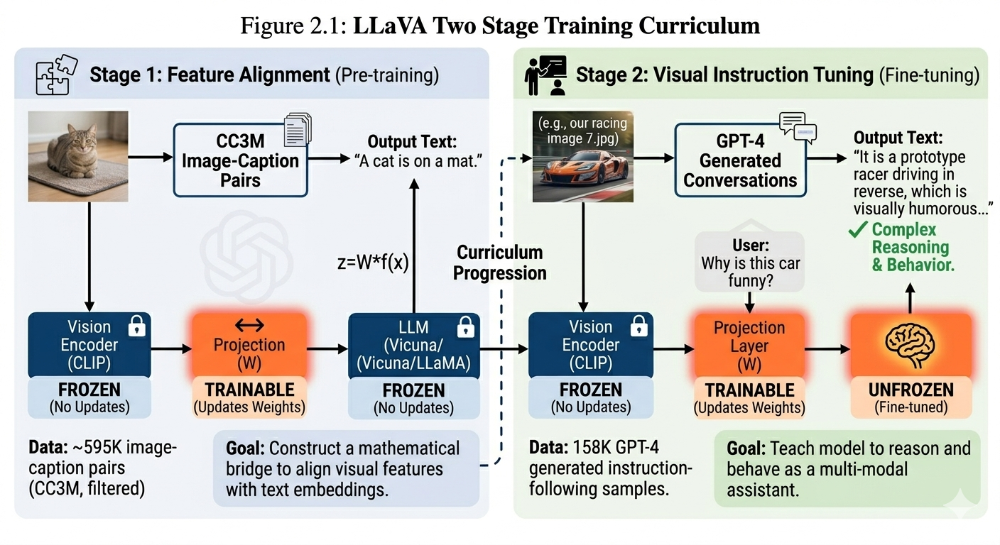

This diagram visually represents the "freezing" logic we discussed and simulated in your code. It shows that Stage 1 is a pure alignment effort (building the bridge), while Stage 2 is when the Language Model is unzipped to learn complex behavior.

In Stage 1 (Feature Alignment), the Vision Encoder and LLM remain frozen, while gradients are updated solely for the random projection layer (W). This establishes modality alignment. In Stage 2 (Visual Instruction Tuning), the Vision Encoder remains frozen to prevent representational drift, while the Projection Layer and the LLM are both unfrozen to learn complex reasoning behavior.

### **Analysis of the Training Curriculum**

The two-stage training strategy is not merely a matter of computational convenience; it is a deliberate architectural choice designed to preserve pre-trained knowledge while enabling new multimodal capabilities.

#### **1. The "Why": Maintaining the Frozen Vision Tower**
In both Stage 1 and Stage 2, the **Vision Encoder (CLIP)** remains frozen. This is critical for two reasons:
* **Preserving General-Purpose Features:** CLIP is a "master" of visual features, having been pre-trained on 400M image-text pairs. It possesses a vast, diversified understanding of the visual world.
* **Preventing Representational Drift:** If we were to unfreeze CLIP and train it on the relatively smaller LLaVA datasets (e.g., CC3M or the 150K instruction set), the model would likely overfit to the specific distribution of the fine-tuning data. This "drift" would degrade its ability to recognize out-of-distribution objects it previously understood perfectly.

#### **2. The "Gradual Opening": Sequential LLM Training**
The decision to wait until Stage 2 to unfreeze the **Language Model (LLM)** is a strategy for training stability:
* **Stage 1 Stability:** During Feature Alignment, the LLM is kept frozen to act as a stable "anchor." The Projection Layer ($W$) is forced to do all the work to map visual features into the LLM's established embedding space. If both were updated simultaneously at the start, the model would struggle to find a stable gradient, often resulting in nonsensical output.
* **Stage 2 Adaptation:** In Visual Instruction Tuning, the LLM is finally unfrozen so it can adapt its conversational "style" and reasoning logic to the presence of visual tokens. This allows the model to move beyond simple description and begin performing complex tasks like reasoning, humor detection, and localized OCR, which require modifying the LLM's attention weights.

---

### **The Training Objective**

Mathematically, both stages utilize the standard **Auto-regressive Language Modeling Loss**:

$$L = - \sum_{t=1}^{L} \log P(y_t \mid x_{image}, y_{<t})$$

Where:
* $y_t$: The target token to be predicted at time $t$.
* $x_{image}$: The projected visual tokens from the image.
* $y_{<t}$: All previously generated tokens in the sequence.

This objective ensures that the model treats visual information as part of the causal context, effectively learning to "read" the image patches as if they were a highly descriptive prefix to the text.

### images 2.1 & 2.2 made using Google Gemini

### Task 2.2: Synthetic Data

A core innovation of LLaVA is the use of Visual Instruction Tuning, powered by a unique pipeline that leverages GPT-4 to create synthetic multi-modal instruction data. By feeding GPT-4 text-based metadata (object lists and bounding box coordinates) from existing images, the authors "hallucinated" high-quality conversations without GPT-4 ever actually "seeing" the pixels.

---

#### **1. Why use synthetic data instead of human annotation?**

* **Cost and Velocity:** Scalable human annotation for complex reasoning tasks (e.g., "Explain why this racing car's position is aerodynamically advantageous") is prohibitively expensive and slow. GPT-4 can generate 158K unique, high-quality conversational samples in a fraction of the time.
* **Complexity Beyond Captions:** Traditional human datasets like COCO are limited to "shallow" descriptions (e.g., "A blue car on a track"). Synthetic generation allows for reasoning-heavy data, including logical deduction, mathematical counting, and counterfactual thinking that humans rarely provide in standard labeling tasks.
* **Instruction Following:** GPT-4 is an expert at following specific formats. Using it as a "teacher" ensures the training data consistently follows the "Question-Answer" format required to turn an LLM into an assistant.



#### **2. What biases might this introduce?**

* **Linguistic Verbosity:** GPT-4 tends to be overly polite, structured, and long-winded. LLaVA inherits this "GPT-style" of speaking, which may not always match the brief or "messy" way real humans interact.
* **Metadata Dependency:** Since GPT-4 generated the instructions based on text descriptions of the image (captions/bounding boxes), any errors in the original metadata were amplified. If the metadata missed a small detail in the background of `7.jpg`, the synthetic conversation would also be "blind" to it.
* **Alignment Echo:** LLaVA inherits GPT-4's internal safety alignments and refusal behaviors, which can lead to the model being overly cautious or refusing to answer benign questions about certain visual contexts.

#### **3. Does this limit generalization?**

* **The "Closed World" Risk:** There is a risk of the model becoming a "stochastic parrot" of GPT-4's reasoning patterns. If the synthetic data doesn't cover a specific domain (e.g., highly technical circuit diagrams or rare medical pathologies), LLaVA struggles to generalize because it hasn't "seen" those logical structures in its instruction-tuning phase.
* **The "Task" Advantage:** Paradoxically, it improves generalization across tasks. Because the synthetic data is so diverse—covering detailed descriptions, complex reasoning, and short Q&A—the model becomes robust at handling *new types of questions* for images it has never encountered before.

---

### **Summary: Evolution in LLaVA-1.5 (Paper 2)**

In Paper 2, the authors addressed the limitations of pure synthetic data by introducing a "Scrutinized Mix." They found that while synthetic data provides the "brain," adding Academic Task Data (VQA, OCR, GQA) provides the "accuracy." This hybrid approach reduced hallucinations and significantly improved the model's ability to read text within images (OCR), as seen in the blurry "Nürburgring" text in our racing sample.


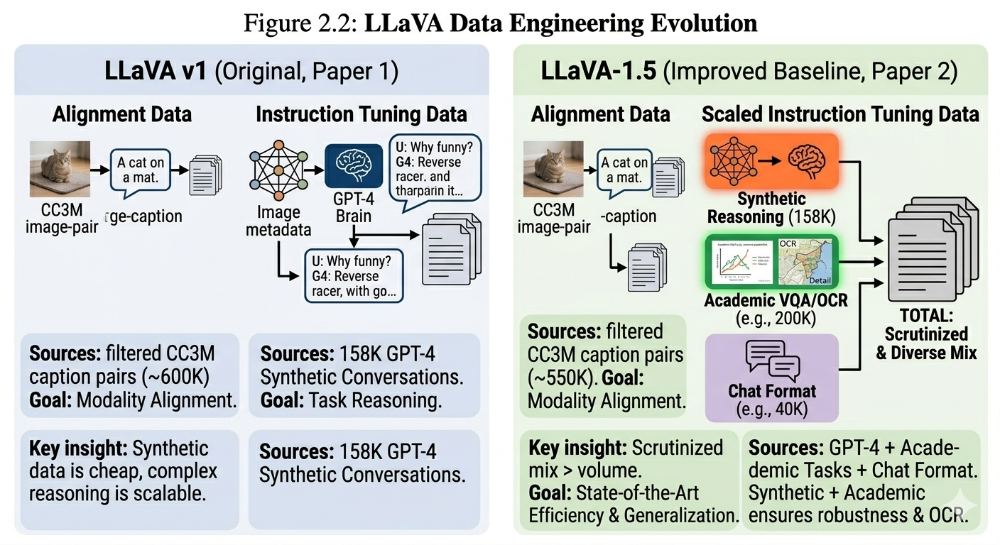

This figure provides a clear lane-by-lane comparison between Paper 1 (Original LLaVA) and Paper 2 (LLaVA-1.5 improved baseline). Paper 1 relied heavily on standard descriptive captions for alignment and 158K GPT-4 synthetic conversations for reasoning. LLaVA-1.5 (Paper 2) demonstrates the 'Data Quality Over Quantity' principle. It shifted away from purely descriptive caption data, instead showing that scaling academic task-oriented data (e.g., GQA, ScienceQA, and specific OCR tasks) was significantly more powerful than scaling volume alone, using a diverse, scrutinized mixture to ensure robustness.

# Part 3 — Reflection

This section evaluates the conceptual boundaries and inherent limitations of the LLaVA framework based on the architectural dissection performed in Parts 1 and 2.

---

### **1. Is LLaVA truly multimodal or a conditioned LLM?**

LLaVA is more accurately described as a **Language Model conditioned on visual features**. 

* **The Argument:** A "truly" multimodal model (like a native multimodal transformer) would ideally learn vision and language features in a shared space from the ground up. 
* **The Reality:** LLaVA treats the image as a "visual prefix." By the time the information reaches the LLM, the pixels have been abstracted into vectors that reside in the same embedding space as words. The LLM is simply performing its standard next-token prediction, unaware that the first 576 tokens originated from a camera rather than a keyboard. It is a powerful integration, but the underlying "brain" remains fundamentally linguistic.

---

### **2. Where does alignment actually happen?**

Alignment in LLaVA is a two-part process, but the "heavy lifting" occurs in different places depending on how you define "alignment":

* **Spatial/Feature Alignment (Stage 1):** This happens exclusively in the Projection Layer. This is where the mathematical translation occurs, ensuring that a "blue car" in CLIP's space lands on the LLM's "blue car" coordinates.
* **Semantic/Behavioral Alignment (Stage 2):** This happens in the LLM itself during Instruction Tuning. This is where the model learns *what to do* with the aligned features—moving from simple recognition to complex reasoning (e.g., "The car is in the pit lane because the crew is present").
* **Conclusion:** Without the Projection Layer, the LLM sees noise. Without Instruction Tuning, the LLM sees the image but doesn't know how to talk about it. Both are required for a functional assistant.

---

### **3. What is the biggest limitation of this architecture?**

The most significant bottleneck is the **Context Window Pressure (Fixed Token Count)**.

* **Linear Bloat:** Because LLaVA maps every $14 \times 14$ patch to a token, a single $336 \times 336$ image permanently consumes **576 tokens**. 
* **The Scaling Problem:** This makes the architecture extremely "heavy" for:
    * **Multi-Image Reasoning:** Attempting to compare four images would consume over 2,300 tokens, leaving very little room for the actual conversation.
    * **Video Processing:** Processing even a short 10-second video at a reasonable frame rate would instantly exceed the context window of most standard LLMs.
* **Resolution Bottleneck:** Increasing the image resolution to see smaller details (like the fine print on the `7.jpg` racing decals) would exponentially increase the token count, eventually crashing the system's memory.

---

### **Final Thoughts**
LLaVA’s success lies in its simplicity. By sacrificing "true" multimodality for a modular, "injection-based" approach, the authors created a framework that is easy to train, easy to scale, and incredibly effective at leveraging the world-class reasoning of pre-trained LLMs.